# 2.0. Importing Libraries

In [4]:
import pandas  as pd
import numpy   as np
import scipy   as sp

from sklearn.cluster          import AgglomerativeClustering
from sklearn.metrics.pairwise import nan_euclidean_distances

In [5]:
import matplotlib        as mpl
import matplotlib.pyplot as plt
import seaborn           as sns
import geopandas         as gpd

from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.tsaplots import plot_acf
from scipy.ndimage   import gaussian_filter
from scipy.spatial   import voronoi_plot_2d

In [6]:
import tensorflow as tf

from tensorflow       import keras
from tensorflow.keras import layers
from sklearn.metrics  import mean_absolute_error
from sklearn.metrics  import mean_squared_error

In [7]:
tf.random.set_seed(42)
np.random.seed(42)

# 3.0. Data Paths

In [8]:
path = "../data/final_data.csv"

path_eggs_data    = path + "eggs_data/"
path_map_data     = path + "map_data/"
path_models_data  = path + "models_data/"

# 4.0. Plot Patterns

In [9]:
colors = {
  "color_north": "#B4C4DF",
  "color_east" : "#FFF7FB",
  "color_west" : "#258BAE",
  "color_south": "#014636",
}

cmap = "PuBuGn"

In [10]:
mpl.rcParams['figure.figsize'] = (18, 8)

In [11]:
sns.set_theme()

# 5.0. Auxiliar Functions

In [12]:
def month_rename(month):
  month_dict = {
    "Janeiro": "Jan",
    "Fevereiro": "Feb",
    "Março": "Mar",
    "Abril": "Apr",
    "Maio": "May",
    "Junho": "June",
    "Julho": "July",
    "Agosto": "Aug",
    "Setembro": "Sep",
    "Outubro": "Oct",
    "Novembro": "Nov",
    "Dezembro": "Dec"
  }

  return month_dict.get(month, "")

def district_rename(district):
  district_dict = {
    "Norte": "North",
    "Norte 1": "North",
    "Norte 2": "North",
    "Sul": "South",
    "Leste": "East",
    "Oeste": "West",
  }

  return district_dict.get(district, "")

In [13]:
def Get_ReorderTraps(eDist, NNeigh):
  # Here we order traps by proximity, return the NNeigh traps for each one
  cnt_Trap = 0
  Current_Trap = 0
  N = len(eDist)
  Ordered_Traps =  np.array(0, dtype=np.uint16)
  Neigh_Traps =  np.zeros((N,NNeigh), dtype=np.uint16)
  Sort_Dist =  np.zeros((N,NNeigh), dtype=np.float16)

  while cnt_Trap<(N-1):
    Dist = eDist[Current_Trap,:]
    #Dist = np.delete(Dist, Ordered_Traps)
    sortIndx = np.argsort(Dist)
    I = ~np.isin(sortIndx, Ordered_Traps)

    Neigh_Traps[cnt_Trap,:] = sortIndx[0:NNeigh]
    Sort_Dist[cnt_Trap,:] = Dist[sortIndx][0:NNeigh]
    cnt_Trap = cnt_Trap + 1

    Current_Trap = sortIndx[I][0]
    Ordered_Traps = np.append(Ordered_Traps, Current_Trap)

  Dist = eDist[Current_Trap,:]
  sortIndx = np.argsort(Dist)
  Neigh_Traps[cnt_Trap,:] = sortIndx[0:NNeigh]
  Sort_Dist[cnt_Trap,:] = Dist[sortIndx][0:NNeigh]
  return Ordered_Traps, Neigh_Traps, Sort_Dist

In [14]:
def AggregateTraps(Ordered_Traps, Loc, NNeigh):
  # Aggregate locations, return centroids and Traps used to aggregate
  NTraps = len(Loc)
  NCent = np.uint8(NTraps/NNeigh)
  Cent = np.zeros((NCent,2),dtype=np.float32)
  Traps = np.zeros((NCent,NNeigh),dtype=np.uint16)

  #Current_Cent = Loc[Current_Trap,].reshape(1,2)
  for iCent in range(NCent):
    I = np.arange(iCent*NNeigh,(iCent+1)*NNeigh)
    # select the closest NNeighborhoods to current trap
    Closest_Traps = Ordered_Traps[I]
    Traps[iCent,] = Closest_Traps
    # Update current centroid
    Current_Cent = np.mean(Loc[Closest_Traps,], axis=0).reshape(1,2)
    Cent[iCent,] = Current_Cent

  return Cent, Traps

In [15]:
def Weigh_Vector(x,w):
  p = x*w
  y = np.nanmean(p)
  return y

In [16]:
def create_ovitraps_matrix(ovitraps_dataframe):
  n_ids   = len(ovitraps_dataframe['ID'].unique())
  n_weeks = 0

  for yr in ovitraps_dataframe['Yr'].unique():
    n_weeks += len(ovitraps_dataframe.query("Yr == @yr")['Week'].unique())

  ovitraps_matrix = np.empty([n_weeks, n_ids])

  for i, id in enumerate(ovitraps_dataframe["ID"].unique()):
    ovitraps_matrix[:, i] = ovitraps_dataframe[ovitraps_dataframe["ID"] == id]["Eggs"]

  return ovitraps_matrix

In [17]:
def create_time_series(data_series, start_year, end_year):
  num_years  = end_year - start_year
  time_index = pd.date_range(f"{start_year}", f"{end_year + 1}", freq="W-FRI").date
  time_index = np.delete(time_index, 0)

  time_series       = data_series
  time_series.index = time_index

  return time_series

In [18]:
def weight_vector(x, w):
  p = x * w
  y = np.nanmean(p)

  return y

In [19]:
def spatial_smoothing(data, neigh_traps, w_dist):
  n_samples, n_traps = data.shape
  ordered_traps      = neigh_traps[:, 0]

  X = np.zeros((n_samples, n_traps), dtype=np.float16)

  for trap_idx in ordered_traps:
    traps   = neigh_traps[trap_idx,]
    weigths = w_dist[trap_idx,]

    for sample_idx in range(n_samples):
      x = data.iloc[sample_idx, traps]
      y = weight_vector(x, weigths)

      X[sample_idx, trap_idx] = y

  return X

In [20]:
def aggregate_values(X, traps):
  n_agg     = traps.shape[0]
  n_samples = X.shape[0]
  X_agg     = np.zeros((n_samples, n_agg), dtype=np.float32)

  for trap_idx in range(n_agg):
    traps_idx = traps[trap_idx,]

    for sample_idx in range(n_samples):
      X_agg[sample_idx, trap_idx] = np.nanmean(X[sample_idx, traps_idx])

  return X_agg

In [ ]:
def create_random_series(matrix_data, number_of_points):
  sampled = matrix_data.sample(number_of_points)
  return sampled.mean().values

In [22]:
def create_dataset(series, week_shift):
  input, target = [], []

  for initial_week in range(series.shape[0] - week_shift + 1):
    data = series.iloc[initial_week : initial_week + week_shift]

    input.append(data.iloc[:week_shift - 1])
    target.append(data.iloc[-1])

  return input, target

In [23]:
def split_train_test(input, target, train_size=0.7):
  train_lenght = int(len(target) * train_size)
  test_lenght  = int(len(target) * (1 - train_size))

  X_train = np.array(input[:train_lenght])
  X_test  = np.array(input[-(test_lenght + 1):])

  y_train = np.array(target[:train_lenght])
  y_test  = np.array(target[-(test_lenght + 1):])

  return X_train, X_test, y_train, y_test

# 6.0. Data Aquisition

To reproduce the results of this notebook, we should process PBH data to have the same format as the one used in the original paper. 

In [24]:
data = pd.read_csv(path)

In [25]:
data.head()

,exercicio,nplaca,narmad,idarmad,endarmad,cep,dtinstal,dtcol,semepi,cdabrange,...,longitude,coordx2,coordy2,zero_perc,Temperatura_week_bfr_mean,Precipitacao_week_bfr_mean,Umidade_week_bfr_mean,Temperatura_previsao,Precipitacao_previsao,Umidade_previsao
0,2018,90000140,901001,901374,97222,9.030691e+09,2018-06-18,2018-06-25,25,901460.0,...,-44.057499,598609.817,7791061.12,0.507246,19.808253,0.000220,68.661096,18.411880,0.000000,67.042419
1,2014,90000215,901001,901374,97222,9.030691e+09,2014-09-22,2014-09-29,39,901460.0,...,-44.057499,598609.817,7791061.12,0.612245,23.642767,1.129355,44.532898,23.126922,1.666262,43.045228
2,2023,90000156,901001,901374,97222,9.030691e+09,2023-05-29,2023-06-05,22,901460.0,...,-44.057499,598609.817,7791061.12,0.474308,18.503445,0.000220,69.176737,18.329463,0.008605,69.389451
3,2013,90000012,901001,901374,97222,9.030691e+09,2013-07-01,2013-07-08,27,901460.0,...,-44.057499,598609.817,7791061.12,0.650000,20.131793,3.002574,62.931308,18.455687,3.216737,59.702816
4,2015,90000272,901001,901374,97222,9.030691e+09,2015-03-30,2015-04-06,13,901460.0,...,-44.057499,598609.817,7791061.12,0.600000,22.886029,0.443180,71.087165,22.085876,0.703419,75.160273


## 6.1. Preprocessing

In [26]:
data.rename(columns={
    "exercicio": "Yr",
    "mesepid": "Month",
    "semepi": "Week",
    "distrito": "District",
    "nombairro": "Neighborhood",
    "idarmad": "ID",
    "novos": "Eggs",
    "latitude": "Lat",
    "longitude": "Lon"
},
    inplace=True
)
    
ovitraps_df = data[["Yr", "Month", "Week", "District", "Neighborhood", "ID", "Eggs", "Lat", "Lon"]]
    

In [27]:
def month_rename_pbh(month):
  month_dict = {
    8.0: "Jan",
    9.0: "Feb",
    10.0: "Mar",
    11.0: "Apr",
    12.0: "May",
    1.0: "June",
    2.0: "July",
    3.0: "Aug",
    4.0: "Sep",
    5.0: "Oct",
    6.0: "Nov",
    7.0: "Dec"
  }

  return month_dict.get(month, "")

def district_rename_pbh(district):
  district_dict = {
    "Norte": "North",
    "Norte 1": "North",
    "Norte 2": "North",
    "Sul": "South",
    "Leste": "East",
    "Oeste": "West",
  }

  return district_dict.get(district, "")

In [28]:
ovitraps_df["Month"]    = ovitraps_df["Month"].apply(month_rename_pbh)
#ovitraps_df["District"] = ovitraps_df["District"].apply(district_rename_pbh)

C:\Users\User\AppData\Local\Temp\ipykernel_6396\1898910737.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ovitraps_df["Month"]    = ovitraps_df["Month"].apply(month_rename_pbh)


### 6.1.1. Filtering Data with Median Greater than 1

In [29]:
Mat = ovitraps_df.pivot(columns='ID', values='Eggs', index=['Yr','Week'] ).sort_index(axis=1, ascending=True)

In [30]:
y = np.nanstd(Mat, axis = 0)
x = np.nanmedian(Mat, axis = 0)
I = x > 1

### 6.1.2. Eggs Data

In [53]:
ovitraps_matrix= Mat
ovitraps_matrix_dataframe = pd.DataFrame(ovitraps_matrix)
ovitraps_matrix_dataframe

ID         900001  900003  900004  900005  900006  900007  900008  900009  \
Yr   Week                                                                   
2011 37       NaN     NaN     2.0     0.0     0.0     6.0     0.0     0.0   
     38      31.0     0.0     NaN     NaN     NaN     NaN     NaN     NaN   
     39       NaN     NaN     0.0     0.0     0.0   223.0     5.0     0.0   
     40       0.0     0.0     NaN     NaN     NaN     NaN     NaN     NaN   
     42       0.0     0.0     NaN     NaN     NaN     NaN     NaN     NaN   
...           ...     ...     ...     ...     ...     ...     ...     ...   
2024 26       0.0     0.0    50.0    97.0    85.0   115.0    50.0     0.0   
     28       0.0     0.0    27.0     0.0     0.0     0.0     0.0     0.0   
     30       0.0    46.0    27.0     0.0     0.0     0.0     1.0   130.0   
     32       0.0     2.0    41.0     0.0   150.0     0.0    27.0     0.0   
     34       0.0     1.0     0.0     0.0     0.0     0.0     0.0   109.0   

ID         900010  900011  ...  902165  902167  902169  902170  902171  \
Yr   Week                  ...                                           
2011 37       0.0     0.0  ...     NaN     NaN     NaN     NaN     NaN   
     38       NaN     NaN  ...     NaN     NaN     NaN     NaN     NaN   
     39       0.0     0.0  ...     NaN     NaN     NaN     NaN     NaN   
     40       NaN     NaN  ...     NaN     NaN     NaN     NaN     NaN   
     42       NaN     NaN  ...     NaN     NaN     NaN     NaN     NaN   
...           ...     ...  ...     ...     ...     ...     ...     ...   
2024 26      46.0     0.0  ...    21.0     0.0   128.0     0.0     0.0   
     28       0.0     0.0  ...    31.0     0.0     0.0     0.0     0.0   
     30       0.0     0.0  ...     4.0     0.0     0.0     0.0     0.0   
     32       6.0     0.0  ...   161.0     0.0     0.0     0.0    10.0   
     34       0.0    59.0  ...    43.0     0.0     0.0     0.0    29.0   

ID         902172  902173  902174  902183  902184  
Yr   Week                                          
2011 37       NaN     NaN     NaN     NaN     NaN  
     38       NaN     NaN     NaN     NaN     NaN  
     39       NaN     NaN     NaN     NaN     NaN  
     40       NaN     NaN     NaN     NaN     NaN  
     42       NaN     NaN     NaN     NaN     NaN  
...           ...     ...     ...     ...     ...  
2024 26      69.0     0.0     0.0     0.0     0.0  
     28       0.0     0.0     0.0     NaN     0.0  
     30       0.0     0.0     0.0     NaN     0.0  
     32       0.0     0.0   116.0     0.0     0.0  
     34      37.0     0.0     0.0     0.0     0.0  

[553 rows x 1773 columns]

In [62]:
ovitraps_matrix.isna().sum(axis=0)

ID
900001    245
900003    247
900004    251
900005    254
900006    251
         ... 
902172    541
902173    541
902174    541
902183    545
902184    543
Length: 1773, dtype: int64

In [78]:
ovitraps_matrix.median(axis=0)>1

ID
900001     True
900003     True
900004     True
900005     True
900006    False
          ...  
902172     True
902173    False
902174    False
902183    False
902184    False
Length: 1773, dtype: bool

<Axes: >

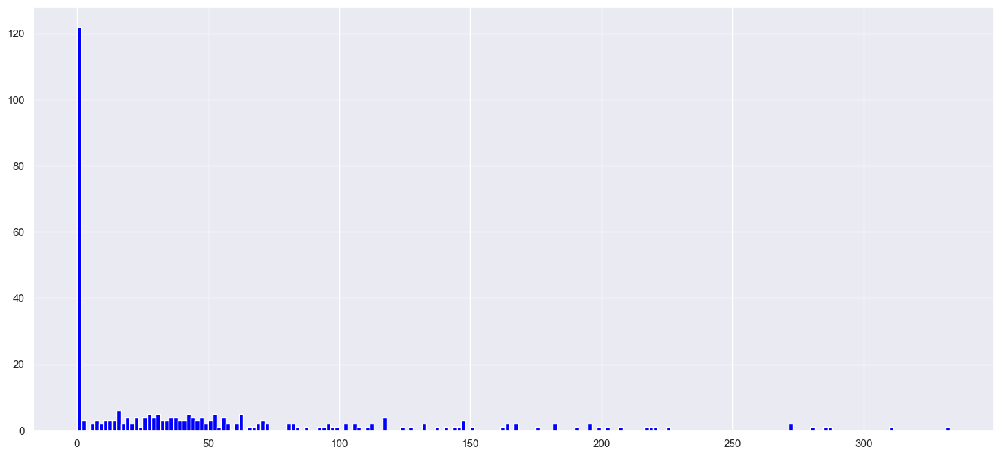

In [71]:
ovitraps_matrix[900001].hist(bins=200, color='blue', alpha=1, label='Ovitrap 900001')

<Axes: >

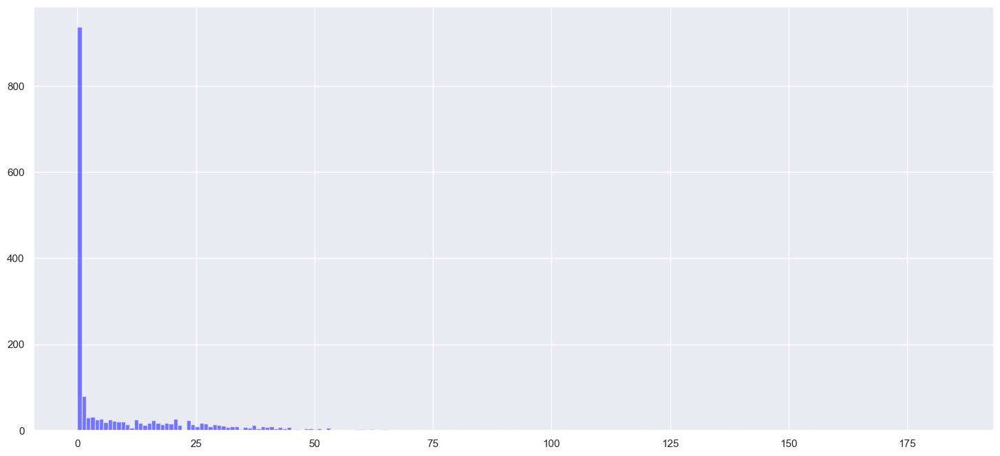

In [61]:
ovitraps_matrix.median(axis=0).hist( bins=200, color='blue', alpha=0.5)

In [32]:
ovitraps_series = ovitraps_matrix_dataframe.mean(axis=1)

ovitraps_series

Yr    Week
2011  37       5.650273
      38       2.559322
      39      14.267760
      40       5.364407
      42       2.060498
                ...    
2024  26      20.341547
      28      16.557471
      30      14.435897
      32      12.580589
      34      16.673963
Length: 553, dtype: float64

### 6.1.3. Eggs Hold Data

In [33]:
ovitraps_matrix_hold           = ovitraps_matrix.iloc[:, I]
ovitraps_matrix_hold_dataframe = pd.DataFrame(ovitraps_matrix_hold)

ovitraps_matrix_hold_dataframe

ID         900001  900003  900004  900005  900008  900015  900016  900017  \
Yr   Week                                                                   
2011 37       NaN     NaN     2.0     0.0     0.0     NaN     0.0     NaN   
     38      31.0     0.0     NaN     NaN     NaN     0.0     NaN     0.0   
     39       NaN     NaN     0.0     0.0     5.0     NaN     0.0     NaN   
     40       0.0     0.0     NaN     NaN     NaN     0.0     NaN     0.0   
     42       0.0     0.0     NaN     NaN     NaN     0.0     NaN     0.0   
...           ...     ...     ...     ...     ...     ...     ...     ...   
2024 26       0.0     0.0    50.0    97.0    50.0     0.0     0.0     0.0   
     28       0.0     0.0    27.0     0.0     0.0     0.0     0.0     0.0   
     30       0.0    46.0    27.0     0.0     1.0     0.0     0.0     0.0   
     32       0.0     2.0    41.0     0.0    27.0     0.0     0.0    29.0   
     34       0.0     1.0     0.0     0.0     0.0    41.0     2.0     0.0   

ID         900019  900024  ...  902155  902156  902158  902159  902160  \
Yr   Week                  ...                                           
2011 37       0.0     7.0  ...     NaN     NaN     NaN     NaN     NaN   
     38       NaN     NaN  ...     NaN     NaN     NaN     NaN     NaN   
     39       0.0    32.0  ...     NaN     NaN     NaN     NaN     NaN   
     40       NaN     NaN  ...     NaN     NaN     NaN     NaN     NaN   
     42       NaN     NaN  ...     NaN     NaN     NaN     NaN     NaN   
...           ...     ...  ...     ...     ...     ...     ...     ...   
2024 26       0.0     7.0  ...    39.0    48.0     0.0   214.0     0.0   
     28       0.0     0.0  ...   103.0     0.0     0.0   136.0     0.0   
     30      18.0     0.0  ...   139.0     0.0     0.0   204.0     0.0   
     32       0.0     0.0  ...    37.0     0.0     0.0     0.0     0.0   
     34       0.0     0.0  ...    80.0     0.0     0.0    52.0     0.0   

ID         902162  902163  902165  902171  902172  
Yr   Week                                          
2011 37       NaN     NaN     NaN     NaN     NaN  
     38       NaN     NaN     NaN     NaN     NaN  
     39       NaN     NaN     NaN     NaN     NaN  
     40       NaN     NaN     NaN     NaN     NaN  
     42       NaN     NaN     NaN     NaN     NaN  
...           ...     ...     ...     ...     ...  
2024 26      11.0     0.0    21.0     0.0    69.0  
     28       5.0     0.0    31.0     0.0     0.0  
     30       0.0   132.0     4.0     0.0     0.0  
     32       0.0     9.0   161.0    10.0     0.0  
     34       3.0    39.0    43.0    29.0    37.0  

[553 rows x 764 columns]

In [79]:
ovitraps_matrix[902173].value_counts()

902173
0.0      7
110.0    1
13.0     1
22.0     1
11.0     1
2.0      1
Name: count, dtype: int64

In [34]:
ovitraps_series_hold = ovitraps_matrix_hold_dataframe.mean(axis=1)

ovitraps_series_hold

Yr    Week
2011  37       7.955056
      38       2.689655
      39      18.932584
      40       3.637931
      42       2.611765
                ...    
2024  26      26.862850
      28      20.737333
      30      18.924863
      32      17.421833
      34      21.961074
Length: 553, dtype: float64

### 6.1.4. Eggs Aggregate Data

In [35]:
locations_df = ovitraps_df[["ID", "Lat", "Lon"]].drop_duplicates()
locations_df.rename(columns={"Lon":"Long"}, inplace=True)

In [36]:
eDist = nan_euclidean_distances(locations_df.iloc[I, :][["Lat", "Long"]], locations_df.iloc[I, :][["Lat", "Long"]])

Ordered_Traps, Neigh_Traps, Sort_Dist = Get_ReorderTraps(eDist,5)

Cent, Traps = AggregateTraps(Ordered_Traps, locations_df.iloc[I, :][["Lat", "Long"]].to_numpy(), 4)

w_dist = np.power(1000, -Sort_Dist).astype(np.float16)

ovitraps_matrix_smooth = spatial_smoothing(ovitraps_matrix_hold, Neigh_Traps, w_dist)

C:\Users\User\AppData\Local\Temp\ipykernel_6396\738399367.py:3: RuntimeWarning: Mean of empty slice
  y = np.nanmean(p)


In [37]:
ovitraps_matrix_agg           = aggregate_values(ovitraps_matrix_smooth, Traps)
ovitraps_matrix_agg_dataframe = pd.DataFrame(ovitraps_matrix_agg)

ovitraps_matrix_agg_dataframe

C:\Users\User\AppData\Local\Temp\ipykernel_6396\509438282.py:10: RuntimeWarning: Mean of empty slice
  X_agg[sample_idx, trap_idx] = np.nanmean(X[sample_idx, traps_idx])


,0,1,2,3,4,5,6,7,8,9,...,181,182,183,184,185,186,187,188,189,190
0,1.775391,0.710938,1.076172,22.250000,9.601562,22.140625,29.328125,NaN,NaN,0.000000,...,18.500000,2.296875,NaN,NaN,NaN,NaN,11.437500,0.322021,16.640625,16.750000
1,11.296875,4.496094,1.463867,1.438477,0.000000,0.000000,0.000000,NaN,NaN,NaN,...,5.605469,0.738281,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN
2,6.773438,2.919922,4.917969,13.546875,15.273438,20.703125,10.164062,NaN,NaN,0.000000,...,42.437500,11.304688,NaN,NaN,NaN,NaN,9.218750,2.810547,0.967773,0.974121
3,0.000000,0.000000,1.039062,10.585938,0.000000,0.000000,0.000000,NaN,NaN,NaN,...,0.000000,1.025391,NaN,NaN,NaN,NaN,0.000000,3.248047,NaN,NaN
4,0.000000,8.281250,8.257812,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,...,0.000000,4.132812,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
548,30.140625,12.539062,9.031250,4.460938,55.281250,26.359375,22.281250,14.914062,15.804688,32.031250,...,47.187500,12.359375,21.125000,15.656250,29.046875,21.937500,25.484375,20.125000,54.250000,19.062500
549,7.054688,26.062500,17.953125,19.984375,32.937500,26.281250,12.429688,15.187500,14.367188,9.257812,...,21.015625,30.468750,22.609375,9.289062,15.320312,16.375000,16.156250,18.484375,23.750000,21.500000
550,14.328125,4.300781,4.765625,20.312500,6.554688,29.890625,15.867188,10.156250,6.347656,7.250000,...,10.945312,19.671875,19.093750,20.765625,27.453125,17.890625,15.148438,20.187500,24.265625,16.734375
551,13.640625,6.117188,5.152344,14.984375,27.750000,26.968750,16.921875,13.296875,3.160156,12.437500,...,5.996094,7.390625,21.078125,14.328125,9.820312,11.015625,12.484375,5.070312,16.343750,16.171875


In [38]:
ovitraps_series_agg = ovitraps_matrix_agg_dataframe.mean(axis=1)

ovitraps_series_agg

0       7.959980
1       1.161574
2      19.572466
3       3.378264
4       1.948549
         ...    
548    25.819511
549    20.545637
550    19.148632
551    16.946085
552    21.207321
Length: 553, dtype: float32

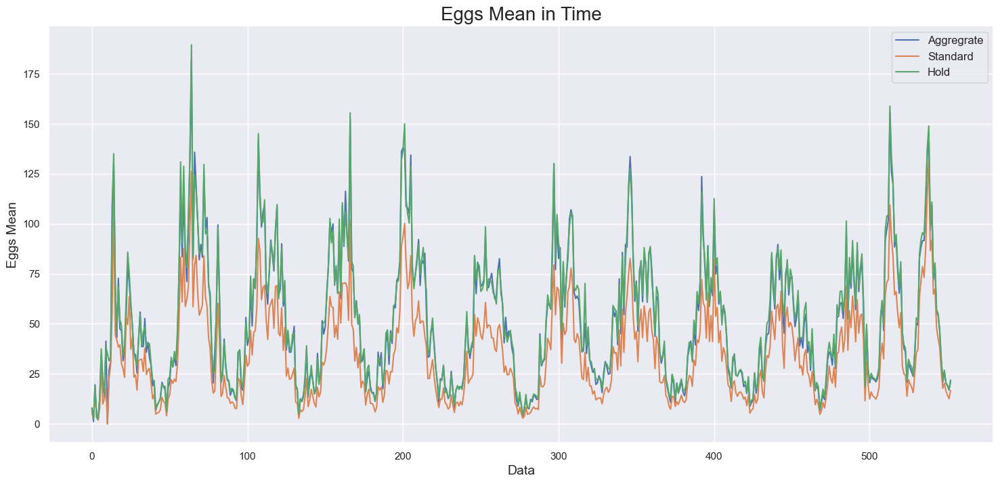

In [39]:
sns.lineplot(x=ovitraps_series_agg.index, y=ovitraps_series_agg.values, label="Aggregrate")
sns.lineplot(x=ovitraps_series_agg.index, y=ovitraps_series.values, label="Standard")
sns.lineplot(x=ovitraps_series_agg.index, y=ovitraps_series_hold.values, label="Hold")

plt.title("Eggs Mean in Time", fontsize=20)
plt.xlabel("Data", fontsize=14)
plt.ylabel("Eggs Mean", fontsize=14)
plt.legend(fontsize=12)

plt.show()

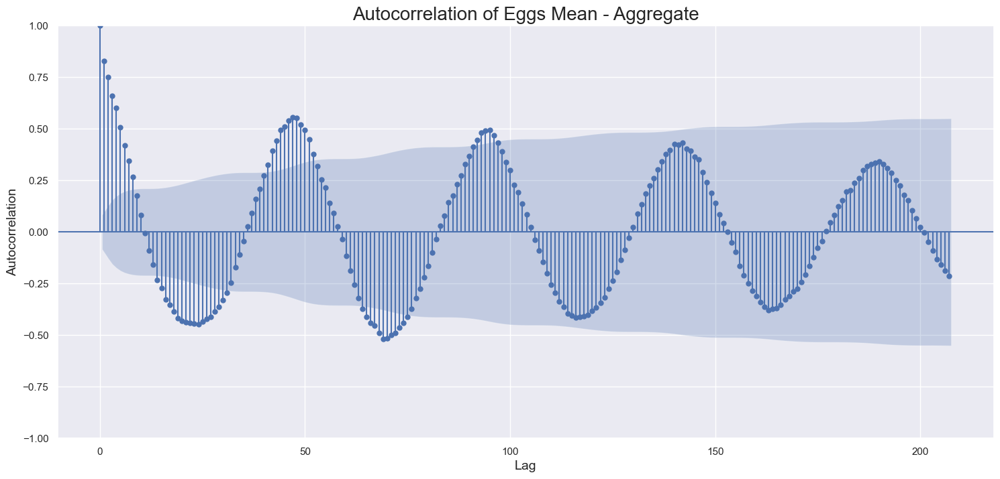

In [40]:
plot_acf(ovitraps_series_agg, lags=207)

plt.title("Autocorrelation of Eggs Mean - Aggregate", fontsize=20)
plt.xlabel("Lag", fontsize=14)
plt.ylabel("Autocorrelation", fontsize=14)

plt.show()

# 8.0. Training Models

## 8.1. Create Data to Train and Test

In [41]:
matrix_data = ovitraps_matrix_agg[: int(ovitraps_matrix_agg.shape[0] * 0.8)].T

matrix_data

array([[  1.7753906 ,  11.296875  ,   6.7734375 , ...,  14.953125  ,
        100.8125    ,  43.90625   ],
       [  0.7109375 ,   4.4960938 ,   2.9199219 , ...,  16.3125    ,
         86.125     ,  90.5625    ],
       [  1.0761719 ,   1.4638672 ,   4.9179688 , ...,  49.875     ,
         99.75      , 101.125     ],
       ...,
       [  0.32202148,   0.        ,   2.8105469 , ...,  44.96875   ,
         52.8125    ,  69.        ],
       [ 16.640625  ,          nan,   0.96777344, ...,          nan,
        123.1875    ,          nan],
       [ 16.75      ,          nan,   0.9741211 , ...,  79.3125    ,
         82.25      ,  58.53125   ]], dtype=float32)

In [42]:
error_dataframe = pd.DataFrame()

### 8.1.1. Creating Random Series

In [ ]:
NUMBER_OF_SERIES = 10
NUMBER_OF_POINTS = 40
WEEK_SHIFT       = 5
NUM_EPOCHS       = 1000

random_dataframe = pd.DataFrame()

In [83]:
print(matrix_data.shape)

(191, 442)


In [87]:
matrix_data

array([[  1.7753906 ,  11.296875  ,   6.7734375 , ...,  14.953125  ,
        100.8125    ,  43.90625   ],
       [  0.7109375 ,   4.4960938 ,   2.9199219 , ...,  16.3125    ,
         86.125     ,  90.5625    ],
       [  1.0761719 ,   1.4638672 ,   4.9179688 , ...,  49.875     ,
         99.75      , 101.125     ],
       ...,
       [  0.32202148,   0.        ,   2.8105469 , ...,  44.96875   ,
         52.8125    ,  69.        ],
       [ 16.640625  ,          nan,   0.96777344, ...,          nan,
        123.1875    ,          nan],
       [ 16.75      ,          nan,   0.9741211 , ...,  79.3125    ,
         82.25      ,  58.53125   ]], dtype=float32)

In [45]:
for i in range(NUMBER_OF_SERIES):
  random_series = pd.DataFrame(create_random_series(pd.DataFrame(matrix_data), NUMBER_OF_POINTS))

  random_dataframe = pd.concat([random_dataframe, random_series], axis=1, ignore_index=True)

random_dataframe.dropna(axis=0,inplace=True)


In [80]:
NUMBER_OF_SERIES

10

In [96]:
for i in range(NUMBER_OF_SERIES):
  print(i)
  random_series = pd.DataFrame(create_random_series(pd.DataFrame(matrix_data), NUMBER_OF_POINTS))
  random_dataframe = pd.concat([random_dataframe, random_series], axis=1, ignore_index=True)


0
Index([156, 150,  79,  88, 140,  85,  16,  83, 168,  62,  27, 110, 109,  15,
        59, 114, 126, 129, 157,   0,  37,   6,   9,  47,  87,  71,  84,  26,
        22,  93, 120,  14, 127, 121,  18, 123, 171,  90,  49, 125],
      dtype='int64')
1
Index([  3,   7, 100, 171,  97,   9,   6,  54,  89,  84, 188,  15,  13,  70,
       123, 113, 144,  35,  18, 136,   0,  67, 126, 181, 152, 146,  85,  80,
        82, 179, 142,  46,  19, 151, 147, 169,  61,  56, 135,  58],
      dtype='int64')
2
Index([ 95, 125, 172,  12, 133, 147, 117, 120, 118,  43, 113,  77, 134,  94,
         9, 104, 142,  55,  96,   4,  71,  64, 176, 131, 148, 178, 116, 186,
        81, 105, 167, 159, 161,  50, 139,   1,  66,  86,  61, 106],
      dtype='int64')
3
Index([ 51, 161,  15,  13,  45,  84,  72,  12, 128,  89, 131,  20,  59, 135,
        34, 109, 188, 186,  55,  58,  53, 183, 116,  35,  16, 118,  37,  30,
       176,  54,   0, 153,  31, 144,  50, 124,  79, 127, 125, 132],
      dtype='int64')
4
Index([ 67,  83,  

## 8.2. MLP (Multilayer Perceptron)

### 8.2.1. Model 1

In [46]:
for column in random_dataframe.columns:
  random_series = random_dataframe.iloc[:, column]
  input, target = create_dataset(random_series, WEEK_SHIFT)

  X_train, X_test, y_train, y_test = split_train_test(input, target, train_size=0.8)


  mlp_model_1 = keras.Sequential([
      layers.Dense(8, input_dim=X_train.shape[1], kernel_initializer="random_uniform", use_bias=True, activation="linear"),
      layers.Dense(16, kernel_initializer="random_uniform", use_bias=True, activation="sigmoid"),
      layers.Dense(1, kernel_initializer="random_uniform", use_bias=True, activation="linear"),
  ], name="mlp_model_1")

  mlp_model_1.compile(loss="mse", optimizer="adam")

  result = mlp_model_1.fit(X_train, y_train, epochs=NUM_EPOCHS)

  y_pred = result.model.predict(X_test)

  error_dataframe.loc[result.model.name, f"MAE_{column}"] = mean_absolute_error(y_test, y_pred)
  error_dataframe.loc[result.model.name, f"RMSE_{column}"] = np.sqrt(mean_squared_error(y_test, y_pred))

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 4120.3008
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4105.7554  
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4091.3181 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4076.5610 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4059.7183 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4039.1326 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4016.2256 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3992.8193 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3968.9524 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3946.1716 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3924.2693 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3903.1375 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3882.6558 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3862.7117 


c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 4421.0830
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4405.6875 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4388.8359 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4370.5654 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4350.6592 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4327.7163 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4304.2905 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4281.7974 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4257.7915 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4233.0625 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4208.9907 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4185.8154 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4163.4023 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4141.6343  
Epoch 15/1000

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4340.7480
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4323.8765 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4306.4736 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4290.8325 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4275.4482 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4259.8433 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4243.4297 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4226.2920 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4208.0791 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4190.6611 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4173.7441 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4157.0366 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4138.5859 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4120.0259 
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4642.3481
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4626.4336 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4606.2495 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4581.8545 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4556.2793 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4529.7178 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4504.6772 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4480.9243 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4458.0254 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4435.8037 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4414.1313 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4392.9111 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4372.0737 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4351.5669 
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4402.6899
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4385.3882 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4362.8271 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4336.5869 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4310.7021 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4286.6973 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4263.8457 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4241.6807 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4219.3418 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4195.3872 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4172.2373 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4149.6489 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4127.5537 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4105.8862 
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4486.9556
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4470.5972 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4451.2715 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4430.4849 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4410.0420 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4388.1846 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4366.0024 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4345.1250 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4325.0078 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4305.4937 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4286.4692 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4267.8438 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4249.5518 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4231.5435 
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4231.6499  
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4213.6177 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4191.2710 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4168.2808 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4147.2637 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4126.3213 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4105.3818 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4082.4822 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4059.1282 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4036.6987 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4014.9309 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3993.7515 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3973.0667 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3952.7964 
Epoch 15/1000

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4079.2695  
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4065.2729 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4050.7585 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4034.4958 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4016.1018 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3997.7380 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3979.0710 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3959.3401 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3939.9509 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3921.2976 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3901.9116 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3879.0256 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3857.0159 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3833.8943 
Epoch 15/1000

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4521.2842  
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4501.3018 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4476.4165 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4452.1704 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4431.3022 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4412.2471 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4393.8721 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4374.8354 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4354.2559 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4332.3491 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4311.1675 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4290.5654 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4270.4795 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4250.8340 
Epoch 15/1000

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3824.9619  
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3810.3801 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3792.5112 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3774.8037  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3759.1223 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3744.2385 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3728.9126 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3711.3574 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3694.2046 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3676.4229 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3655.4075 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3635.1113 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3615.5112 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3596.5708 
Epoch 15/100

In [104]:
input[1]

1     1.098958
2    16.682692
3     2.020996
4     0.988140
Name: 9, dtype: float32

### 8.2.2. Model 2

In [44]:
for column in random_dataframe.columns:
  random_series = random_dataframe.iloc[:, column]
  input, target = create_dataset(random_series, WEEK_SHIFT)

  X_train, X_test, y_train, y_test = split_train_test(input, target, train_size=0.8)

  mlp_model_2 = keras.Sequential([
      layers.Dense(8, input_dim=X_train.shape[1], kernel_initializer="random_uniform", use_bias=True, activation="linear"),
      layers.Dense(32, kernel_initializer="random_uniform", use_bias=True, activation="sigmoid"),
      layers.Dense(1, kernel_initializer="random_uniform", use_bias=True, activation="linear"),
  ], name="mlp_model_2")

  mlp_model_2.compile(loss="mse", optimizer="adam")

  result = mlp_model_2.fit(X_train, y_train, epochs=NUM_EPOCHS)

  y_pred = result.model.predict(X_test)

  error_dataframe.loc[result.model.name, f"MAE_{column}"] = mean_absolute_error(y_test, y_pred)
  error_dataframe.loc[result.model.name, f"RMSE_{column}"] = np.sqrt(mean_squared_error(y_test, y_pred))

Epoch 1/1000


c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4100.4648
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4067.6279 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4029.9846 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3991.3850 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3951.7925 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3911.8608 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3871.5630 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3833.1589 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3796.2246 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3760.5029 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3725.8201 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3692.0220 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3658.9883 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3626.6250 
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4432.5376
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4402.7725 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4371.0962 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4339.5684 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4309.3481 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4279.2627 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4246.5806 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4211.3672 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4173.6841 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4137.6660 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4102.9917 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4067.2368 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4029.0239 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3992.5723 
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 4351.1807
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4322.1704 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4291.3906 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4259.9980 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4229.7354 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4199.6646 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4167.8047 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4130.9175 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4092.0957 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4052.5137 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4012.2427 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3970.0798 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3922.4575 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3873.2664 
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4639.6938
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4608.4526 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4570.1680 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4527.6934 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4484.9043 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4443.0239 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4402.9473 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4362.0283 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4319.2573 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4278.1396 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4238.3745 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4198.8164 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4159.1504 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4120.5835 
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4427.7568
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4398.2983 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4363.5068 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4328.8740 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4295.4116 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4259.4517 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4222.4546 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4184.9761 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4148.3481 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4111.9648 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4074.9006 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4038.6499 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4001.5178 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3965.4932 
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 4490.5376
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4460.6636 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4425.1816 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4386.9258 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4347.9609 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4309.2427 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4271.1235 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4232.5293 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4192.9355 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4155.1045 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4118.1270 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4080.2449 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4042.3723 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4003.8643 
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 4236.5801
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4206.7378 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4167.1699 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4122.4180 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4080.5857 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4040.1392 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4000.6353 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3961.0701 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3921.2798 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3882.5510 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3844.4189 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3804.7122 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3764.2822 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3725.0789 
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4078.3296
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4052.4888 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4022.0811 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3985.1943 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3945.6841 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3904.9995 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3864.6646 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3825.2595 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3784.1345 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3744.0896 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3704.0156 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3664.8416 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3627.0049 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3590.3359 
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 4530.0986
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4497.7822 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4459.8730 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4422.8560 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4388.0361 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4352.9165 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4314.3438 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4274.5835 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4234.7988 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4196.2002 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4158.9858 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4121.4312 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4083.6609 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4045.5923 
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 3813.8318
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3781.2087 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3742.4331 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3705.7053 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3672.1694 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3635.6482 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3599.4495 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3564.9949 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3531.7437 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3499.1536 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3465.4734 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3432.4697 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3398.0010 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3361.2744 
Epoch 15/1000
1

In [114]:
random_series = random_dataframe.iloc[:, column]
input, target = create_dataset(random_series, WEEK_SHIFT)

X_train, X_test, y_train, y_test = split_train_test(input, target, train_size=0.8)

mlp_model_2 = keras.Sequential([
    layers.Dense(8, input_dim=X_train.shape[1], kernel_initializer="random_uniform", use_bias=True, activation="linear"),
    layers.Dense(32, kernel_initializer="random_uniform", use_bias=True, activation="sigmoid"),
    layers.Dense(1, kernel_initializer="random_uniform", use_bias=True, activation="linear"),
], name="mlp_model_2")

mlp_model_2.compile(loss="mse", optimizer="adam")

result = mlp_model_2.fit(X_train, y_train, epochs=NUM_EPOCHS)

y_pred = result.model.predict(X_test) 

plt.plot(y_pred.shift(1), label="Predicted")
plt.plot(y_test[:-1], label="True")
plt.title("MLP Model 1 - Predicted vs True", fontsize=20)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Eggs Mean", fontsize=14)
plt.legend(fontsize=12)
plt.show()


c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 3567.2576
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 3534.6165 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 3495.2290
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 3456.2402
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 3422.3921
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 3391.6790
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3362.3218
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 3331.9880
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3294.6929 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3255.3206 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 3217.0671
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 3177.5156
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 3138.5554 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3101.0195 

KeyboardInterrupt: 

## 8.3. LSTM (Long-Short Therm Memory)

### 8.3.1. LSTM 1

In [45]:
for column in random_dataframe.columns:
  random_series = random_dataframe.iloc[:, column]
  input, target = create_dataset(random_series, WEEK_SHIFT)

  X_train, X_test, y_train, y_test = split_train_test(input, target, train_size=0.8)

  lstm_model_1 = keras.Sequential([
      layers.LSTM(32, input_shape=(X_train.shape[1], 1), use_bias=True, activation="relu"),
      layers.Dense(1, kernel_initializer="random_uniform", use_bias=True, activation="linear")
  ], name="lstm_model_1")

  lstm_model_1.compile(loss="mse", optimizer="adam")

  result = lstm_model_1.fit(X_train, y_train, epochs=NUM_EPOCHS)

  y_pred = result.model.predict(X_test)

  error_dataframe.loc[result.model.name, f"MAE_{column}"] = mean_absolute_error(y_test, y_pred)
  error_dataframe.loc[result.model.name, f"RMSE_{column}"] = np.sqrt(mean_squared_error(y_test, y_pred))

Epoch 1/1000


c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 3978.7051
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3898.3530 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3777.7021 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3431.7070 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2407.9260 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 858.1553  
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 768.2245  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 602.6935 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 563.6348 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 532.9332 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 491.1035 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 463.7120 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 442.7726 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 428.9738 
Epoch 15/1000
11/11 ━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 4493.2036
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4317.9131 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3934.1807 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2709.6985 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1204.5328 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1004.5613 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 814.9750  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 748.6024  
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 671.9178 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 615.0681 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 565.1692 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 525.2867 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 496.9544 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 484.1145 
Epoch 15/1000
11/11 ━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 4185.0806
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3862.9558 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3420.5679 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2545.3130 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 999.3391  
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 950.8902  
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 776.9149  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 719.8986 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 638.9498
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 569.3299
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 522.0295
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 534.8373
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 504.7766
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 471.5484
Epoch 15/1000
11/11 ━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4647.2637
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4632.7104 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4555.0625 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4115.5269 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2662.5481 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1018.2767 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 923.6234  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 835.8524  
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 791.5721  
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 764.5991
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 731.9976 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 691.2803  
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 641.7650  
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 611.4379  
Epoch 15/1000
11

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 4382.2388
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4108.1748 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3784.3770 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2895.5259 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1232.7513 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 794.1640  
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 750.6012  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 697.5272 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 672.1157  
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 634.1989  
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 590.2210 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 552.4605 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 513.4672 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 504.7226 
Epoch 15/1000
11/1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 4503.7241
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4434.5693 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4342.0088 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4175.3691 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3829.4277 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2647.6230 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1001.4683 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 790.2248  
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 712.1415  
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 670.6276 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 599.9325 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 560.3502 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 529.2343 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 503.0320 
Epoch 15/1000
11/11 

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 4084.5239
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3981.8196 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3814.3337 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3416.8796 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2122.6829 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 787.0338  
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 805.0668  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 642.9471 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 597.5161 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 527.8038  
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 473.7693 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 439.0008
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 416.1346 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 401.9842 
Epoch 15/1000
11/11 

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4154.8872
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4034.0154 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3883.5708 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3491.5732 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1852.3975 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 846.9391  
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 755.4847  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 706.4816  
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 677.5297  
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 636.6096  
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 613.6082  
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 594.8092
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 576.0820
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 561.0182 
Epoch 15/1000
11/1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 4507.5122
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4422.3423 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4307.7651 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4018.0981 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2864.8640 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1092.1205 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 988.3118  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 817.9054  
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 737.0076  
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 695.1595 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 643.2340  
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 588.2584  
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 543.4781 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 508.4170 
Epoch 15/1000
11/

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 3753.3503
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3499.1785 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2951.1587 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1620.0287 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 671.3768
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 577.7060
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 534.2609 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 508.1678 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 478.5278 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 453.1433 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 443.7917 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 423.4794 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 405.0202 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 384.8953 
Epoch 15/1000
11/11 ━━━━━

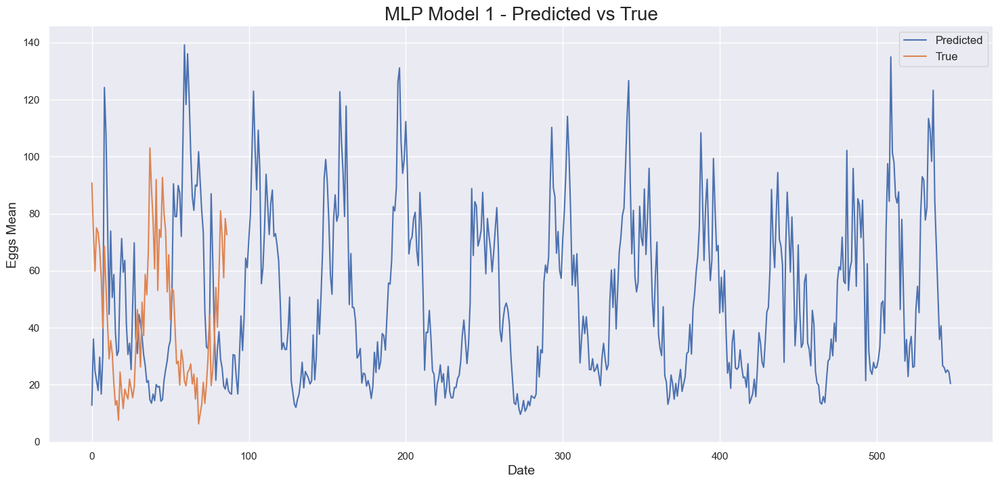

In [116]:
plt.plot(y_pred[1:], label="Predicted")
plt.plot(y_test[:-1], label="True")
plt.title("MLP Model 1 - Predicted vs True", fontsize=20)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Eggs Mean", fontsize=14)
plt.legend(fontsize=12)
plt.show()

### 8.3.2. Model 2

In [46]:
for column in random_dataframe.columns:
  random_series = random_dataframe.iloc[:, column]
  input, target = create_dataset(random_series, WEEK_SHIFT)

  X_train, X_test, y_train, y_test = split_train_test(input, target, train_size=0.8)

  lstm_model_2 = keras.Sequential([
      layers.LSTM(128, input_shape=(X_train.shape[1], 1), use_bias=True, activation="relu"),
      layers.Dense(1, kernel_initializer="random_uniform", use_bias=True, activation="linear")
  ], name="lstm_model_2")

  lstm_model_2.compile(loss="mse", optimizer="adam")

  result = lstm_model_2.fit(X_train, y_train, epochs=NUM_EPOCHS)

  y_pred = result.model.predict(X_test)

  error_dataframe.loc[result.model.name, f"MAE_{column}"] = mean_absolute_error(y_test, y_pred)
  error_dataframe.loc[result.model.name, f"RMSE_{column}"] = np.sqrt(mean_squared_error(y_test, y_pred))

Epoch 1/1000


c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 3697.1697
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2099.2346
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 972.0195  
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 674.1447  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 602.9136 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 547.9215 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 491.0090
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 454.7674
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 436.4185
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 449.7494 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 422.0890 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 393.9308
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 394.9621
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 392.4425 
Epoch 15/1000
11/11 ━━━━━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 4408.4976
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3383.7893
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1053.5576 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 795.6421  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 701.7351  
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 629.0100 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 581.0272 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 550.0209 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 540.4489
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 521.0403
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 501.8866
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 483.8041
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 486.4571 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 486.7400 
Epoch 15/1000
11/11 ━━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 3916.6528
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 2277.8943
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1080.1992
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 816.8650 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 761.5820 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 684.7468 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 599.2681 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 529.3764
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 509.4501
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 491.9998
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 476.5448
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 475.0590
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 499.3061
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 521.5185 
Epoch 15/1000
11/11 ━━━━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4621.9692
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3598.8533 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1234.2725 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 972.8479  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 861.9167  
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 755.1804 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 695.2455  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 630.0493
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 587.6334 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 568.2267
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 538.1406  
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 524.0363 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 522.8989 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 510.6474 
Epoch 15/1000
11/11 ━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 4420.5342
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3740.8457 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1378.9441 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 921.8176 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 760.7140  
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 679.3720 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 600.6084
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 548.7996
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 514.5997 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 497.9629
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 481.5387
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 477.9706
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 461.9166 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 446.3775
Epoch 15/1000
11/11 ━━━━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 4340.3574
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3653.2065 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1383.5533 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 950.3149  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 761.5094 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 654.5969
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 592.2481
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 541.1196
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 495.9381
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 481.2223
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 509.8407
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 503.2099
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 466.3127
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 441.9697 
Epoch 15/1000
11/11 ━━━━━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4059.1355
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3165.5298 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 980.8956  
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 766.2461  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 670.4292 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 596.3409 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 525.9950 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 472.1838 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 417.8069
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 433.6841 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 426.8651
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 420.5234
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 376.1378 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 367.5799 
Epoch 15/1000

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4021.9441
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2105.1104 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 953.1194  
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 740.6774 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 677.6690  
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 621.4316  
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 566.9630 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 536.3904 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 514.7463 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 504.5876
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 503.5107
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 521.2238
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 510.6564
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 486.5296
Epoch 15/1000
11/11 ━━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 4456.1113
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3116.6877
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 1090.6915
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 879.7094 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 806.6550 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 722.0726
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 645.7943
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 570.6819
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 538.3255
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 542.6666
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 564.7164
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 554.0475
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 511.3122
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 485.1743
Epoch 15/10

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 3614.9148
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2118.9133 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 859.8547  
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 626.3067 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 571.3671 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 514.9843 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 456.4804 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 415.3417 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 400.0177
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 418.9489 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 395.4550 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 358.0718 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 338.7269 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 323.8293 
Epoch 15/1000
11/11 ━━━━━━

### 8.3.3. Model 3

In [ ]:
for column in random_dataframe.columns:
  random_series = random_dataframe.iloc[:, column]
  input, target = create_dataset(random_series, WEEK_SHIFT)

  X_train, X_test, y_train, y_test = split_train_test(input, target, train_size=0.8)

  lstm_model_3 = keras.Sequential([
      layers.LSTM(128, input_shape=(X_train.shape[1], 1), use_bias=True, activation="relu", return_sequences=True),
      layers.LSTM(128, use_bias=True, activation="relu"),
      layers.Dense(1, kernel_initializer="random_uniform", use_bias=True, activation="linear")
  ], name="lstm_model_3")

  lstm_model_3.compile(loss="mse", optimizer="adam")

  result = lstm_model_3.fit(X_train, y_train, epochs=NUM_EPOCHS, verbose=0)

  y_pred = result.model.predict(X_test)

  error_dataframe.loc[result.model.name, f"MAE_{column}"] = mean_absolute_error(y_test, y_pred)
  error_dataframe.loc[result.model.name, f"RMSE_{column}"] = np.sqrt(mean_squared_error(y_test, y_pred))

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


KeyboardInterrupt: 

## 8.4. GRU (Gated Recurrent Unity)

### 8.4.1. Model 1

In [48]:
for column in random_dataframe.columns:
  random_series = random_dataframe.iloc[:, column]
  input, target = create_dataset(random_series, WEEK_SHIFT)

  X_train, X_test, y_train, y_test = split_train_test(input, target, train_size=0.8)

  gru_model_1 = keras.Sequential([
      layers.GRU(32, input_shape=(X_train.shape[1], 1), use_bias=True, activation="relu"),
      layers.Dense(1, kernel_initializer="random_uniform", use_bias=True, activation="linear")
  ], name="gru_model_1")

  gru_model_1.compile(loss="mse", optimizer="adam")

  result = gru_model_1.fit(X_train, y_train, epochs=NUM_EPOCHS)

  y_pred = result.model.predict(X_test)

  error_dataframe.loc[result.model.name, f"MAE_{column}"] = mean_absolute_error(y_test, y_pred)
  error_dataframe.loc[result.model.name, f"RMSE_{column}"] = np.sqrt(mean_squared_error(y_test, y_pred))

Epoch 1/1000


c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 3908.1477
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3742.0940 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3530.1096 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3163.9915  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2417.7571 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1313.5984 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 617.9255 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 610.3898 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 557.3475 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 537.7725 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 524.0626
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 510.8643  
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 502.7423 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 491.4612 
Epoch 15/1000
11/11 ━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 4289.4160
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4108.2891 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3805.0510 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3232.0625 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2414.8962  
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1208.9628 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 735.1326  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 649.8289 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 603.0644 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 584.9546 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 564.6700
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 546.3157
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 530.5646 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 516.1219 
Epoch 15/1000
11/11 ━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 4280.9863
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4183.6343  
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4047.4883 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3848.0449 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3453.5483 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2524.0198 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 923.0728  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 758.7456  
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 652.4313
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 637.6885   
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 618.5993  
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 608.0434  
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 591.1569  
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 572.3611  
Epoch 15/1000

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 4460.1567
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4266.4438 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4044.8501 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3791.6917 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3409.5493 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2792.1665 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1670.2065 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 810.1644  
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 804.7009
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 719.9554   
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 713.0209  
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 706.5756  
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 695.9399  
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 684.0377  
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 4453.3628
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4153.6909 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 3720.4856
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3055.3145  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1968.6218 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 854.0933  
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 782.9783  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 653.4862  
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 622.7341  
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 600.6194  
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 593.4229 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 566.5018 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 548.4365 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 531.3494 
Epoch 15/1000
11/1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 4481.4360
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4302.6919 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4099.1504 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3807.2112 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3310.8535 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2318.7065 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 968.7985  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 722.0712 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 635.0201
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 619.0906 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 596.9617 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 583.5179 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 570.4861 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 557.4742 
Epoch 15/1000
11/11 ━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 4135.1753
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4002.1863 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3848.7385 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3614.7397 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3127.7432 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2245.4419 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 931.7257  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 621.4675 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 498.9890 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 445.0788 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 427.7330 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 421.2445 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 409.8134 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 401.2162 
Epoch 15/1000
11/11 ━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 3932.1204
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3784.3093 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3613.3113 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3300.9548 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2476.5022 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 992.9947  
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 630.6531  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 578.6167  
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 565.4291  
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 549.6789 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 539.6618 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 530.0192 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 520.1036 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 509.8096 
Epoch 15/1000
11/11 

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 4525.8042
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4395.9634 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4250.9790 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4010.6270 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3499.5007 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2639.3391  
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1172.9985 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 834.6990  
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 740.3707  
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 713.4614  
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 677.3324  
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 648.1091  
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 619.3754  
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 590.1158  
Epoch 15/1000


c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 3693.3811
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3536.6577 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3308.1467 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2892.8298 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2083.7600 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 904.5272  
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 585.4800 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 526.7244 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 505.7843 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 492.2382  
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 489.9772 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 478.8211 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 469.2018 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 459.8259 
Epoch 15/1000
11/11 ━━

### 8.4.2. Model 2

In [49]:
for column in random_dataframe.columns:
  random_series = random_dataframe.iloc[:, column]
  input, target = create_dataset(random_series, WEEK_SHIFT)

  X_train, X_test, y_train, y_test = split_train_test(input, target, train_size=0.8)

  gru_model_2 = keras.Sequential([
      layers.GRU(128, input_shape=(X_train.shape[1], 1), use_bias=True, activation="relu"),
      layers.Dense(1, kernel_initializer="random_uniform", use_bias=True, activation="linear")
  ], name="gru_model_2")

  gru_model_2.compile(loss="mse", optimizer="adam")

  result = gru_model_2.fit(X_train, y_train, epochs=NUM_EPOCHS)

  y_pred = result.model.predict(X_test)

  error_dataframe.loc[result.model.name, f"MAE_{column}"] = mean_absolute_error(y_test, y_pred)
  error_dataframe.loc[result.model.name, f"RMSE_{column}"] = np.sqrt(mean_squared_error(y_test, y_pred))

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4063.6602
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3610.1321 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2462.7476 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 734.7023  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 648.8020  
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 600.0875 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 556.6458 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 508.6113 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 484.2560 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 459.9948 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 452.9497 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 441.8420 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 432.8410 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 423.1708
Epoch 15/10

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4378.4482
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3621.1272 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1933.2382 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 903.7158  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 680.7905 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 654.8729 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 617.7243 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 580.6293 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 554.1041 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 537.2192
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 527.6004 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 533.7615 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 512.9769 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 498.2183 
Epoch 15/1000
11/11 ━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4138.2578
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3495.9866 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1757.1266 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 894.4998  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 692.4905  
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 631.3922 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 583.6348  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 558.9889  
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 541.4612  
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 519.6024 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 516.0460 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 502.7084 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 495.9143 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 485.5451
Epoch 15/1000
11/11 ━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4473.2900
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3882.0564 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2413.9717 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 930.3895  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 789.1190  
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 741.1204  
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 693.8638  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 661.3127 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 630.7255  
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 606.8497  
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 586.9912  
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 569.0689  
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 556.0270  
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 544.7839  
Epoch 15/1000
1

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 4330.1865
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3643.0806 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1902.7499 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 888.9805  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 676.4302  
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 633.4985  
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 602.3062 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 568.7278 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 526.3544 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 502.3781 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 504.3122 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 541.1827 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 484.7264
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 475.0231
Epoch 15/1000
11/11 ━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4422.9912
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3785.1897 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2119.9556 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 856.4739  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 624.6155 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 589.4370
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 539.9293 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 524.9357 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 499.0128 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 476.8568 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 473.9224 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 492.0693 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 486.4417 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 460.6585 
Epoch 15/1000
11/11 ━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4052.4883
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3026.2996 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 907.1015  
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 658.9203  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 607.8514 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 546.9109 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 494.8260 
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 468.9003 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 451.2238
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 428.7233 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 421.1611 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 417.8080
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 426.2597 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 407.8225 
Epoch 15/1000
11/11 ━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 3885.0325
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2934.5732 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1091.5587 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 728.7474 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 668.9374
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 631.5161  
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 595.6302  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 564.8488  
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 543.5374 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 528.1014 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 523.3196 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 512.4105 
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 514.7523 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 505.1795 
Epoch 15/1000
11/11 ━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 4398.6318
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3354.7576 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1127.5255 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 797.2974  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 751.8856  
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 661.4449  
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 617.7983  
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 582.5004  
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 572.0511  
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 553.7164 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 540.4084 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 526.5969
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 519.2244 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 509.4402 
Epoch 15/1000
11/11 

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 3811.5767
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3196.3230 
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1746.8683 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 691.5996  
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 506.3891 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 478.9930 
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 447.4820
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 426.5583
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 403.6940 
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 387.9166 
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 379.1665 
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 374.9943
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 367.7716 
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 359.3581 
Epoch 15/1000
11/11 ━━━━━━━

In [ ]:
locations_df

,ID,Lat,Lon
0,901374,-19.974521,-44.057499
284,901375,-19.984561,-44.053943
566,901376,-19.977669,-44.053692
848,901377,-19.974816,-44.061480
1130,901378,-19.977715,-44.057558
...,...,...,...
468394,902061,-19.796700,-43.947889
468412,902062,-19.786108,-43.971220
468431,902065,-19.782779,-43.975511
468449,902066,-19.783162,-43.982240


In [ ]:
locations_df

,ID,Lat,Lon
0,901374,-19.974521,-44.057499
284,901375,-19.984561,-44.053943
566,901376,-19.977669,-44.053692
848,901377,-19.974816,-44.061480
1130,901378,-19.977715,-44.057558
...,...,...,...
468394,902061,-19.796700,-43.947889
468412,902062,-19.786108,-43.971220
468431,902065,-19.782779,-43.975511
468449,902066,-19.783162,-43.982240


### 8.4.3. Model 3

In [50]:
for column in random_dataframe.columns:
  random_series = random_dataframe.iloc[:, column]
  input, target = create_dataset(random_series, WEEK_SHIFT)

  X_train, X_test, y_train, y_test = split_train_test(input, target, train_size=0.8)

  gru_model_3 = keras.Sequential([
      layers.GRU(128, input_shape=(X_train.shape[1], 1), use_bias=True, activation="relu", return_sequences=True),
      layers.GRU(128, use_bias=True, activation="relu"),
      layers.Dense(1, kernel_initializer="random_uniform", use_bias=True, activation="linear")
  ], name="gru_model_3")

  gru_model_3.compile(loss="mse", optimizer="adam")

  result = gru_model_3.fit(X_train, y_train, epochs=NUM_EPOCHS)

  y_pred = result.model.predict(X_test)

  error_dataframe.loc[result.model.name, f"MAE_{column}"] = mean_absolute_error(y_test, y_pred)
  error_dataframe.loc[result.model.name, f"RMSE_{column}"] = np.sqrt(mean_squared_error(y_test, y_pred))

Epoch 1/1000


c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 3900.5454
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 2223.3835
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 930.1755
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 659.0270
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 571.0877
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 525.8114
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 496.1333
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 471.2621
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 458.9902
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 460.0106
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 450.3894
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 433.6537
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 424.6502
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 428.9500
Epoch 15/1000
11/11 ━━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 4279.3901
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 2614.9543
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1093.0336
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 742.5010 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 642.1995
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 585.5743
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 553.9771
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 528.0057
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 522.2462
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 531.5447
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 507.8534
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 488.0865
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 486.7009
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 504.0820
Epoch 15/1000
11/11 ━━━━━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - loss: 4307.4790
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3427.3652
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 964.0735
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 750.1549
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 654.7415
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 614.7200
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 579.6780
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 555.5581
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 533.2641
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 510.7899
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 506.1632
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 489.1234
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 488.6762
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 486.4690
Epoch 15/1000
11/11 ━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 4558.2563
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2646.8145
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1064.4597
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 836.1199 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 745.1177 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 698.7081
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 665.2734
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 638.7123 
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 612.5641
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 584.0533
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 559.8337
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 549.2193
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 544.0057
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 538.4399
Epoch 15/1000
11/11 ━━━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 4231.9004
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 2271.8616
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 943.9916
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 711.7040
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 643.0245
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 586.8400
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 557.2493
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 528.5368
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 492.3113
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 470.0155
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 468.3460
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 499.8792
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 483.3198
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 457.6255
Epoch 15/1000
11/11 ━━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 4380.1963
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2931.7505
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 984.9683
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 668.2530
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 575.0925
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 543.6140
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 519.9788
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 503.2240
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 487.6132
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 479.9744
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 475.7635
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 471.7571
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 472.9250
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 459.2123
Epoch 15/1000
11/11 ━━━━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 4007.6636
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2306.7898
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 857.9548
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 623.6696
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 544.4146
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 498.7559
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 463.5224
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 431.1509
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 413.7844
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 420.7269
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 426.9444
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 406.6996
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 391.4015
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 389.7909
Epoch 15/1000
11/11 ━━━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 3914.6514
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 2577.0125
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 974.7733
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 690.9643
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 611.4671
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 569.4332
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 541.1817
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 511.5581
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 505.1009
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 502.2612
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 487.6305
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 488.8619
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 488.0254
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 491.8667
Epoch 15/1000
11/11 ━━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 4316.3862
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2214.6023
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 914.9749 
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 765.6479 
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 670.7519 
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 624.4374
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 593.0342
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 595.1745
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 582.9390
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 546.8998
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 526.6877
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 545.4392
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 555.3370
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 542.9265
Epoch 15/1000
11/11 ━━━━━━━━━━━━

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 3632.1101
Epoch 2/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 2103.9766
Epoch 3/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 760.6220
Epoch 4/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 540.3828
Epoch 5/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 464.7217
Epoch 6/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 423.9306
Epoch 7/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 398.7236
Epoch 8/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 393.5747
Epoch 9/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 390.3419
Epoch 10/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 379.3087
Epoch 11/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 372.2118
Epoch 12/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 367.8033
Epoch 13/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 367.4924
Epoch 14/1000
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 367.0707
Epoch 15/1000
11/11 ━━━━━━━━━━

# 9.0. Models Errors

In [51]:
error_dataframe

,MAE_0,RMSE_0,MAE_1,RMSE_1,MAE_2,RMSE_2,MAE_3,RMSE_3,MAE_4,RMSE_4,MAE_5,RMSE_5,MAE_6,RMSE_6,MAE_7,RMSE_7,MAE_8,RMSE_8,MAE_9,RMSE_9
mlp_model_1,10.330337,13.343020,11.227838,14.435238,12.207678,15.863206,10.004330,13.310452,12.564700,16.369360,11.672445,15.710096,11.743064,15.608876,10.732135,14.743781,11.506786,15.543757,10.585643,13.274089
mlp_model_2,10.312034,13.289735,10.950027,14.212605,12.461850,16.204353,9.990154,13.104779,12.602825,16.446440,11.543823,15.563484,11.788423,15.445209,10.920101,15.075134,11.570102,15.669770,10.321365,12.940655
lstm_model_1,13.706732,18.071211,17.504059,22.665129,17.498821,24.304144,14.688675,18.604700,17.771608,24.091515,17.571333,24.510700,19.281263,25.469900,16.580748,21.978165,17.173048,23.660234,13.941757,17.422112
lstm_model_2,13.297904,17.214230,14.396982,19.087315,15.997565,20.874111,15.464309,20.341221,17.564837,23.153248,17.783562,22.839561,18.046278,22.289427,15.857316,20.756367,14.403237,20.069851,13.281301,17.597662
lstm_model_3,13.668349,17.436825,15.806635,20.891577,15.950531,20.537535,13.557257,17.411230,15.706299,21.326265,14.805142,20.126705,16.610353,21.646492,15.699774,22.750376,16.587221,23.207829,13.434237,17.650003
gru_model_1,13.854609,18.666927,15.837042,19.757532,15.453253,20.709064,12.299878,15.883514,17.120661,23.186823,15.789964,21.009792,16.598326,22.840769,15.693583,21.885435,17.734137,24.795412,12.845331,16.816746
gru_model_2,13.668283,17.455589,15.164292,20.010191,16.176813,20.947937,14.786210,18.389469,13.842904,18.004799,16.201998,21.113628,17.390322,22.730595,15.224207,22.162352,15.703720,20.844107,13.919633,17.117460
gru_model_3,12.891685,16.598370,16.010412,20.934647,15.526370,20.216311,13.728918,17.435081,15.864823,22.058451,16.583946,22.079369,15.630105,21.264681,17.772316,23.618708,13.416909,17.813944,13.154784,17.452002


In [52]:
mae_columns  = [column for column in error_dataframe.columns if "MAE" in column]
rmse_columns = [column for column in error_dataframe.columns if "RMSE" in column]

In [53]:
mae_mean_error  = error_dataframe[mae_columns].T.mean()
rmse_mean_error = error_dataframe[rmse_columns].T.mean()

mean_error_dataframe = pd.DataFrame({
  "MAE": mae_mean_error,
  "RMSE": rmse_mean_error
}, index = mae_mean_error.index)

mean_error_dataframe

,MAE,RMSE
mlp_model_1,11.257496,14.820189
mlp_model_2,11.246071,14.795217
lstm_model_1,16.571804,22.077780
lstm_model_2,15.609329,20.422298
lstm_model_3,15.182581,20.298483
gru_model_1,15.322680,20.555202
gru_model_2,15.207838,19.877613
gru_model_3,15.058027,19.947157


In [54]:
mean_error_dataframe.sort_values("MAE")

,MAE,RMSE
mlp_model_2,11.246071,14.795217
mlp_model_1,11.257496,14.820189
gru_model_3,15.058027,19.947157
lstm_model_3,15.182581,20.298483
gru_model_2,15.207838,19.877613
gru_model_1,15.322680,20.555202
lstm_model_2,15.609329,20.422298
lstm_model_1,16.571804,22.077780


In [55]:
mean_error_dataframe.sort_values("RMSE")

,MAE,RMSE
mlp_model_2,11.246071,14.795217
mlp_model_1,11.257496,14.820189
gru_model_2,15.207838,19.877613
gru_model_3,15.058027,19.947157
lstm_model_3,15.182581,20.298483
lstm_model_2,15.609329,20.422298
gru_model_1,15.322680,20.555202
lstm_model_1,16.571804,22.077780


# 10.0. Selecting best models

In [107]:
input, target = create_dataset(ovitraps_series_agg, WEEK_SHIFT)

X_train, X_test, y_train, y_test = split_train_test(input, target, train_size=0.8)

## 10.1. LSTM

In [ ]:
lstm_model = keras.Sequential([
    layers.LSTM(32, input_shape=(X_train.shape[1], 1), use_bias=True, activation="relu"),
    layers.Dense(1, kernel_initializer="random_uniform", use_bias=True, activation="linear")
], name="lstm_model")

lstm_model.compile(loss="mse", optimizer="adam")

result = lstm_model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=NUM_EPOCHS, verbose=0)

c:\Users\User\miniconda3\envs\venv_ovitraps\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 3797.2849 - val_loss: 3733.1887
Epoch 2/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 3559.5701 - val_loss: 3428.5076
Epoch 3/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3200.6978 - val_loss: 2578.4424
Epoch 4/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 2102.4531 - val_loss: 783.0300
Epoch 5/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 712.3259 - val_loss: 646.1412
Epoch 6/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 550.9598 - val_loss: 549.3301
Epoch 7/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 510.2417 - val_loss: 513.0208
Epoch 8/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 480.2887 - val_loss: 476.6433
Epoch 9/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 446.1409 - val_loss: 417.0408
Epoch 10/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 405.3519 - val_loss: 351.3140
Epoch 11/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 374.3250 - val_loss: 314.0864
Epoc

In [109]:
y_pred = []

for value in input:
  value = np.array(value)

  y_pred.append(result.model.predict(value.reshape(1, 4))[0][0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━

In [110]:
pred_series_by_lstm = pd.DataFrame(y_pred, index=ovitraps_series_agg[4:].index)

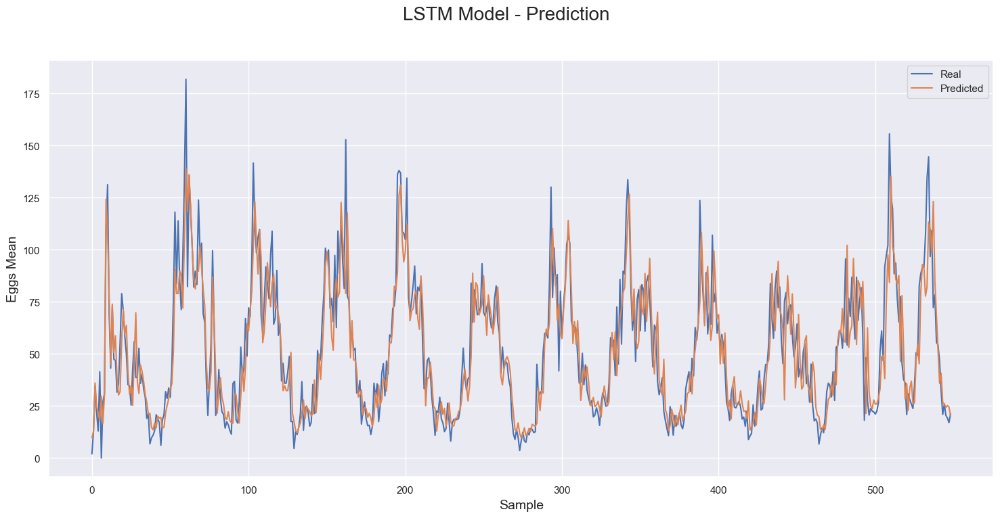

In [111]:
fig, ax = plt.subplots()

fig.suptitle("LSTM Model - Prediction", fontsize=20)

ax.plot(ovitraps_series_agg[4:].values, label="Real")
ax.plot(y_pred, label="Predicted")

ax.set_ylabel("Eggs Mean", fontsize=14)
ax.set_xlabel("Sample", fontsize=14)

ax.legend()
plt.show()

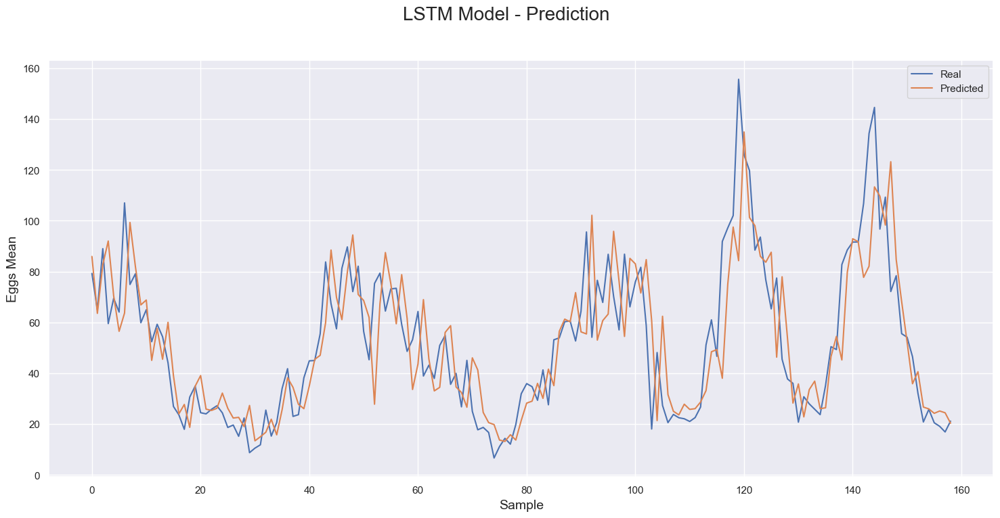

In [112]:
fig, ax = plt.subplots()

fig.suptitle("LSTM Model - Prediction", fontsize=20)

ax.plot(ovitraps_series_agg[4+390:].values, label="Real")
ax.plot(y_pred[390:], label="Predicted")

ax.set_ylabel("Eggs Mean", fontsize=14)
ax.set_xlabel("Sample", fontsize=14)

ax.legend()
plt.show()

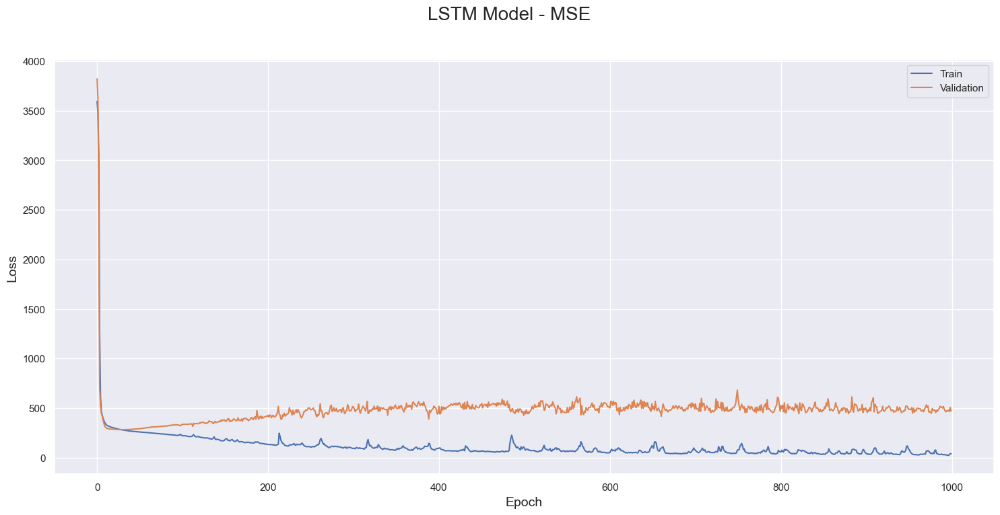

In [61]:
fig, ax = plt.subplots()

fig.suptitle("LSTM Model - MSE", fontsize=20)

ax.plot(result.history["loss"], label="Train")
ax.plot(result.history["val_loss"], label="Validation")

ax.set_ylabel("Loss", fontsize=14)
ax.set_xlabel("Epoch", fontsize=14)

ax.legend()
plt.show()

## 10.2. GRU

In [62]:
gru_model = keras.Sequential([
    layers.GRU(32, input_shape=(X_train.shape[1], 1), use_bias=True, activation="relu"),
    layers.Dense(1, kernel_initializer="random_uniform", use_bias=True, activation="linear")
], name="gru_model")

gru_model.compile(loss="mse", optimizer="adam")

result = gru_model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=NUM_EPOCHS)

Epoch 1/1000
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 3881.1934 - val_loss: 3880.7009
Epoch 2/1000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 3713.7222 - val_loss: 3673.6509
Epoch 3/1000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3494.2629 - val_loss: 3341.7261
Epoch 4/1000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 3048.3586 - val_loss: 2137.3782
Epoch 5/1000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1704.3573 - val_loss: 460.5529
Epoch 6/1000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 470.5448 - val_loss: 379.9422
Epoch 7/1000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 387.2029 - val_loss: 350.9874
Epoch 8/1000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 377.7272 - val_loss: 341.8199
Epoch 9/1000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 370.4420 - val_loss: 324.5419
Epoch 10/1000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 361.8152 - val_loss: 314.5901
Epoch 11/1000
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 357.2952 - val_los

In [ ]:
y_pred = []

for value in input:
  value = np.array(value)
  y_pred.append(result.model.predict(value.reshape(1, 4))[0][0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━

In [64]:
pred_series_by_gru = pd.DataFrame(y_pred, index=ovitraps_series_agg[4:].index)

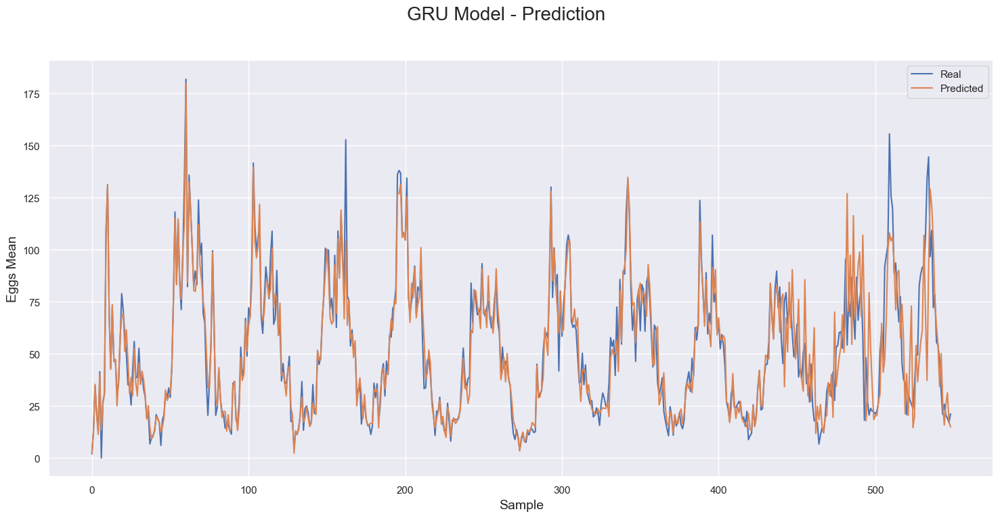

In [65]:
fig, ax = plt.subplots()

fig.suptitle("GRU Model - Prediction", fontsize=20)

ax.plot(ovitraps_series_agg[4:].values, label="Real")
ax.plot(y_pred, label="Predicted")

ax.set_ylabel("Eggs Mean", fontsize=14)
ax.set_xlabel("Sample", fontsize=14)

ax.legend()
plt.show()

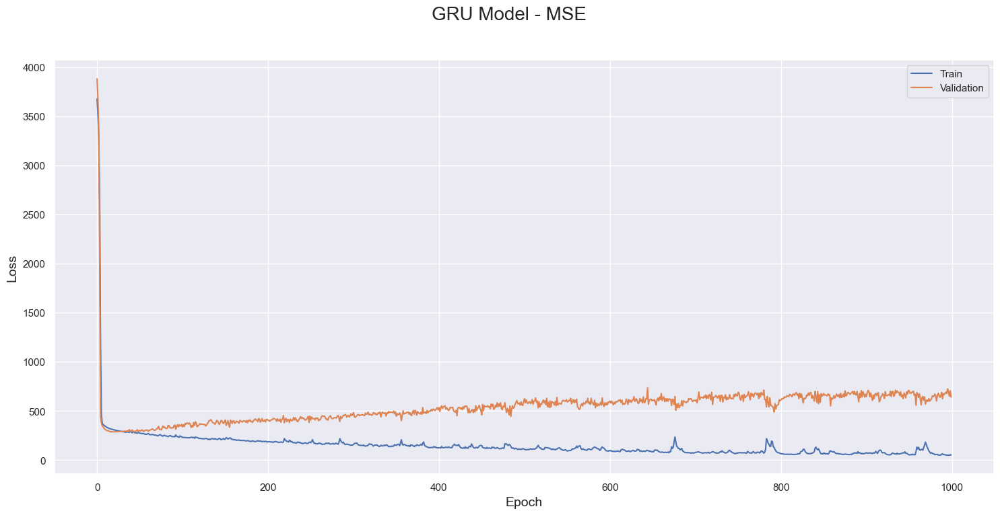

In [66]:
fig, ax = plt.subplots()

fig.suptitle("GRU Model - MSE", fontsize=20)

ax.plot(result.history["loss"], label="Train")
ax.plot(result.history["val_loss"], label="Validation")

ax.set_ylabel("Loss", fontsize=14)
ax.set_xlabel("Epoch", fontsize=14)

ax.legend()
plt.show()

## 10.3. For Each Ovitrap Aggregated Point

In [67]:
int(ovitraps_matrix_agg.shape[0] * 0.8)

442

In [68]:
data_to_predict = pd.DataFrame(ovitraps_matrix_agg).iloc[int(ovitraps_matrix_agg.shape[0] * 0.8):]

data_to_predict.head()

,0,1,2,3,4,5,6,7,8,9,...,181,182,183,184,185,186,187,188,189,190
442,34.90625,48.4375,24.890625,43.68750,63.56250,53.8125,67.6250,80.87500,21.5625,45.1875,...,74.9375,35.0625,39.781250,109.68750,59.37500,89.312500,68.56250,45.03125,130.2500,73.125
443,41.50000,71.7500,95.125000,76.06250,77.68750,72.8125,70.3125,54.09375,66.6875,84.6875,...,107.0000,83.3750,75.125000,50.90625,116.81250,84.562500,37.21875,90.25000,NaN,112.750
444,70.62500,121.0625,74.687500,59.53125,49.03125,48.6875,85.0000,32.31250,39.2500,58.7500,...,64.1875,84.3750,67.375000,53.31250,44.46875,66.000000,35.90625,21.68750,79.5625,66.500
445,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.00000,NaN,NaN,NaN,NaN,NaN
446,133.25000,95.6250,82.375000,63.84375,144.75000,204.2500,139.8750,27.78125,59.4375,179.5000,...,90.5625,91.1875,19.796875,33.50000,41.62500,7.082031,61.40625,95.12500,NaN,60.250


In [117]:
pred_matrix_by_lstm = pd.DataFrame()
pred_matrix_by_gru  = pd.DataFrame()

for idx_i, col in enumerate(data_to_predict.columns):
  pred_lstm = []
  pred_gru  = []

  input_row, target = create_dataset(data_to_predict[col], WEEK_SHIFT)

  for idx_j, input in enumerate(input_row):
    input = np.array(input)
    input = input.reshape(1, 4)

    pred_lstm.append(lstm_model.predict(input)[0][0])
    pred_gru.append(gru_model.predict(input)[0][0])


  pred_matrix_by_lstm[idx_i] = pred_lstm
  pred_matrix_by_gru[idx_i]  = pred_gru

NameError: name 'data_to_predict' is not defined